
#NPL Fake News DataSet#

Lucas Jaenisch Lopes

In [1]:
!pip install tomotopy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 16.5 MB 3.4 MB/s 


#Initial Imports#

In [2]:
import sys
import spacy
import pandas as pd
import tomotopy as tp
import numpy as np
import gensim  
import re
from sklearn.feature_extraction.text import CountVectorizer
from google.colab import drive

spacy.cli.download("en_core_web_md")
nlp = spacy.load('en_core_web_md')

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')


#Load Documents#

In [3]:
drive.mount('/content/drive')
fpath='/content/drive/MyDrive/'
df=pd.read_csv(fpath+'True.csv')
df.columns

Mounted at /content/drive


Index(['title', 'text', 'subject', 'date'], dtype='object')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21417 entries, 0 to 21416
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   title    21417 non-null  object
 1   text     21417 non-null  object
 2   subject  21417 non-null  object
 3   date     21417 non-null  object
dtypes: object(4)
memory usage: 669.4+ KB


In [5]:
df.drop('subject', inplace=True, axis=1)
df.drop('date', inplace=True, axis=1)
df.drop('title', inplace=True, axis=1)

#NLP#

In [6]:
def get_average_feature_length(docs, feature):
  total_size = 0
  max_size = 0
  min_size = 999

  # print(docs)
  # print(feature)

  for i in docs:
    length = len(i)
    total_size += length
  
    if length > max_size:
      max_size = length

    if length < min_size:
      min_size = length

  print(f"\n{'-'*15} {feature} {'-'*15}")
  print(f"Average length: {int(total_size / len(docs))}")
  print(f"Max length: {max_size}")
  print(f"Min length: {min_size}")
  print(f"Total length (not unique): {total_size}")
  return int(total_size / len(docs))

avg_text_size = get_average_feature_length(df['text'], 'text')


--------------- text ---------------
Average length: 2383
Max length: 29781
Min length: 1
Total length (not unique): 51042676


#HTML to plain text#


In [7]:
from bs4 import BeautifulSoup as soup

clean_text = []
r = len(df)

for f in df.columns:
  if f == 'text':
    for i in df[f][:r]:
      clean_text.append((soup(i, "lxml").text, len(i)))

In [8]:
new_text = []

for i in range(r):
  if not clean_text[i][1] > avg_text_size:
    new_text.append(clean_text[i][0])

In [9]:
df.head()

,text
0,WASHINGTON (Reuters) - The head of a conservat...
1,WASHINGTON (Reuters) - Transgender people will...
2,WASHINGTON (Reuters) - The special counsel inv...
3,WASHINGTON (Reuters) - Trump campaign adviser ...
4,SEATTLE/WASHINGTON (Reuters) - President Donal...


In [10]:
# Rejoin all remaining rows to the DataFrame
clean_df = pd.DataFrame()
clean_df['text'] = new_text

df = clean_df

#Stop Words#

In [11]:
spacy.cli.download("en_core_web_md")
nlp = spacy.load('en_core_web_md')

✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_md')


In [12]:
def convert_to_string(df, feature) -> str:
  output = []
  for i in range(len(df[feature])):
    output.append(df[feature][i].strip())
  return output

texts = convert_to_string(df, 'text')

dlemma = []
for i in texts:
  tdoc=nlp(i.lower())
  lm=" ".join([token.lemma_ for token in tdoc  if not(token.pos_ == 'NUM' or token.is_stop == True or token.is_digit == True or token.is_punct == True or token.lemma == False or token.like_email or  token.pos_ == 'VERB' or token.lemma_.startswith('@') or len(token.lemma_) < 3)])
  dlemma.append(lm)

for d1, d2 in zip(texts, dlemma):
  print(d1, '\n=>', d2)
  print()


The following statements were posted to the verified Twitter accounts of U.S. President Donald Trump, @realDonaldTrump and @POTUS.  The opinions expressed are his own. Reuters has not edited the statements or confirmed their accuracy.  @realDonaldTrump : - While the Fake News loves to talk about my so-called low approval rating, @foxandfriends just showed that my rating on Dec. 28, 2017, was approximately the same as President Obama on Dec. 28, 2009, which was 47%...and this despite massive negative Trump coverage & Russia hoax! [0746 EST] - Why is the United States Post Office, which is losing many billions of dollars a year, while charging Amazon and others so little to deliver their packages, making Amazon richer and the Post Office dumber and poorer? Should be charging MUCH MORE! [0804 EST] -- Source link: (bit.ly/2jBh4LU) (bit.ly/2jpEXYR) 
=> following statement twitter account u.s president donald trump opinion reuters statement accuracy fake news low approval rating rating dec a

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



BEIJING (Reuters) - China on Friday urged all parties in Syria to try to find a  political settlement in the six-year-old war after a U.S. military strike on a Syrian airfield, which came as China’s president met with U.S. President Donald Trump.  China also hoped that “relevant parties stay calm, exercise restraint and avoid doing anything that might raise tensions”, Foreign Ministry spokeswoman Hua Chunying said. “The latest developments in Syria again speak to the urgent need for a political settlement to resolve the Syria issue,” Hua Chunying told reporters at a regular briefing. “We call on all relevant parties to resolutely stick to promoting a political settlement and not abandon efforts to find a political settlement.” U.S. officials said the military launched dozens of cruise missile strikes against an airbase controlled by Syrian leader Bashar al-Assad’s forces in response to the chemical attack on Tuesday in a rebel-held area. Facing his biggest foreign policy crisis since t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)





WASHINGTON (Reuters) - Republican and Democratic members of the U.S. House of Representatives introduced a resolution reaffirming American support for NATO on Wednesday, in a rebuke of criticism of the alliance by presumptive Republican presidential nominee Donald Trump.  The resolution introduced by Republican Adam Kinzinger and Democrat John Delaney says that the North American Treaty Organization is central to the national security interest of the United States. Campaigning for president, Trump has said the 67-year-old alliance is obsolete and costs the United States too much, and that European nations should look after their own defense. “The world is safer with an engaged America, and I firmly believe our participation in NATO greatly matters to America’s national security,” Kinzinger said in a statement. Including the two lead sponsors, the resolution was backed by two Republicans and 18 Democrats. 
=> washington reuters republican democratic member u.s house representative res

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



berlin reuters german court wednesday year old german bookkeeper auschwitz fit prison plea sentence oskar groening physically frail year prison role murder people nazi death camp auschwitz sentence legal argument health prosecutor august medical examination groening fit prison sentence lawyer wednesday court northern german town celle high regional court expert opinion man able term despite advanced age sentence fundamental right special need age prison court battle major holocaust trial prosecutor groening auschwitz nazi poland regime responsible mass murder bank note trainload jews groening morally guilty enthusiastic nazi auschwitz age jews holocaust adolf hitler

LONDON (Reuters) - British negotiators are still working out a deal with the European Union, Treasury minister Liz Truss said on Wednesday, calling reports that the government has agreed a sum of money to pay the Brexit bill  media speculation . Truss told parliament that  nothing is agreed until everything is agreed  in t

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




PHNOM PENH (Reuters) - Sweden said on Thursday it would rethink its engagement with Cambodia if the main opposition party is dissolved, in the strongest warning yet from a Western aid donor. The government has filed a suit to dissolve the Cambodia National Rescue Party (CNRP) after charging its leader, Kem Sokha, with treason. He rejected the charge as politically motivated. Excluding the opposition party would allow veteran Prime Minister Hun Sen a clear field to extend his 32-year rule at the next election in 2018. Swedish Human Rights Ambassador Annika Ben David told a news conference at the end of a five-day visit the banning of the  opposition party could have consequences.  Should the Cambodia National Rescue Party be dissolved, this will force my government to rethink our engagement Cambodia,  she said. Other Western countries have condemned the arrest of Kem Sokha and warned against dissolving the CNRP, but have not raised the possibility of action.  David did not elaborate on

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 united nations reuters united states friday u.n security council meeting monday draft resolution additional sanction north korea missile nuclear program u.s mission united nations statement united states security council oil embargo north korea export textile hiring north korean laborer abroad subject leader kim jong asset freeze travel ban draft resolution reuter wednesday immediately clear north korean ally china russia senior u.s official friday night skepticism nation stringent ban import north korean textile chinese official privately fear oil embargo massive instability neighbor security council resolution vote favor veto permanent member britain united states france russia china tension korean peninsula north development weapon string missile year japan sixth nuclear test sunday south korea possible missile test north korea anniversary saturday expert isolated regime close goal powerful nuclear weapon capable united states president donald trump

BRASILIA (Reuters) - Brazil s t

#N grams#

In [13]:
from gensim.models.phrases import Phrases, Phraser

import gensim.utils

In [14]:
min_length = 4
dtoken = [gensim.utils.simple_preprocess(d, deacc=True, min_len=min_length) for d in dlemma]

for i in dtoken:
  if 'character' in i and 'offset' in i:
    print(i)
    
  # print(i)

bigram  = Phraser(Phrases(dtoken, min_count=5, threshold=15))
bdocs   = [bigram[d] for d in dtoken]


# [print(i) for i in bdocs]

In [15]:
print((bdocs)[:10])

[['following_statement', 'twitter_account', 'president_donald', 'trump', 'opinion', 'reuters', 'statement_accuracy', 'fake_news', 'approval_rating', 'rating', 'approximately', 'president', 'obama', 'despite', 'massive', 'negative', 'trump', 'coverage', 'russia', 'hoax', 'united_states', 'post', 'office', 'billion_dollar', 'year', 'amazon', 'little', 'package', 'amazon', 'rich', 'post', 'office', 'dumber', 'poor', 'source_link', 'jpexyr'], ['following_statement', 'twitter_account', 'president_donald', 'trump', 'opinion', 'reuters', 'statement_accuracy', 'america_great', 'lnpkaq', 'east', 'cold', 'year', 'record', 'little', 'good', 'global_warming', 'country', 'country', 'trillion_dollar', 'source_link', 'jpexyr'], ['washington_reuters', 'alabama', 'secretary_state', 'john', 'merrill', 'democratic_senator', 'elect', 'doug_jones', 'winner', 'thursday', 'despite', 'opponent', 'moore', 'challenge', 'phone', 'moore', 'conservative', 'allegation', 'teenage_girl', 'court', 'challenge', 'late',

In [16]:
bigrams = []

for i in bdocs:
  for j in i:
    bigrams.append(j)
    if '_' in j:
      print(j)

Streaming output truncated to the last 5000 lines.
angela_merkel
north_korea
manila_reuters
north_korea
security_council
missile_test
foreign_minister
united_states
united_nations
tough_sanction
north_korea
advanced_hydrogen
north_korea
foreign_minister
economic_sanction
tension_korean
north_korea
leader_jong
defiance_sanction
sixth_nuclear
north_korea
bilateral_trade
north_korea
north_korea
security_council
economic_sanction
security_council
seoul_reuters
south_korean
north_korea
sixth_large
nuclear_test
north_korea
nuclear_test
south_korean
north_korea
nuclear_test
north_korea
nuclear_test
south_korea
berlin_reuters
federal_prosecutor
wide_range
chancellor_angela
merkel_conservative
mexico_city
north_korea
united_states
mexico_city
president_enrique
pena_nieto
pyongyang_nuclear
north_korea
north_korean
nuclear_program
united_states
foreign_policy
north_korean
mexico_city
north_korea
foreign_minister
luis_videgaray
united_states
american_free
trade_agreement
international_condemnation

#Removing Dups#

In [21]:
bigramized = bigrams
uniques = set(bigramized)
uniques = dict(zip(range(len(uniques)), uniques))

print("Total bigrams: ", len(bigramized))
print("Unique bigrams: ",  len(uniques))

Total bigrams:  793280
Unique bigrams:  30486


In [ ]:
# uniques.values()

#Tokenize#

In [22]:
def tokenize(dlemma):
  max_size = len(dlemma); count = 0
  output = []
  
  for i in dlemma:
    # if count % 200 == 0:
      # print(f"{count}/{max_size}")
    
    aux = []; doc = nlp(i)

    for token in doc:
      if token.pos_ in ['NOUN', 'PROPN']:
        aux.append(token.lemma_)
    output.append(aux)
    count += 1
  return output
        
tokens = tokenize(uniques.values())
tokens[:10]

[['hunton'],
 ['respite'],
 [],
 ['motivation'],
 ['nominee'],
 [],
 [],
 ['euronext'],
 [],
 ['memorabilia']]

In [23]:
# remove empty objects from the tokens

print("Old number of Tokens: ", len(tokens))
clean_tokens = []
for t in tokens:
  if t != []:
    clean_tokens.append(t)
tokens = clean_tokens
print("New number of Tokens: ", len(tokens))

Old number of Tokens:  30486
New number of Tokens:  18944


In [24]:
# [print(d) for d in tokens]

#Statistics#

In [25]:
number_of_docs = len(tokens)
number_of_docs

18944

In [26]:
def stats_about_the_docs(docs, feature):
  total_size = 0
  max_size = 0
  min_size = 999

  for i in docs:
    length = len(i)
    total_size += length
  
    if length > max_size:
      max_size = length

    if length < min_size and length != 0:
      min_size = length
    
  print(f"{'-'*10} {feature} {'-'*10}")
  print(f"Average # of {feature}: {int(total_size / len(docs))}")
  print(f"Max # of {feature}: {max_size}")
  print(f"Min # of {feature}: {min_size}")

stats_about_the_docs(bdocs, 'text')

---------- text ----------
Average # of text: 67
Max # of text: 170
Min # of text: 8


#WordCloud#

In [27]:
def create_single_string(tokens):
  output = ''
  for i in tokens:
    for j in i:
      output += j + " "

  return output

output = create_single_string(tokens)
# output

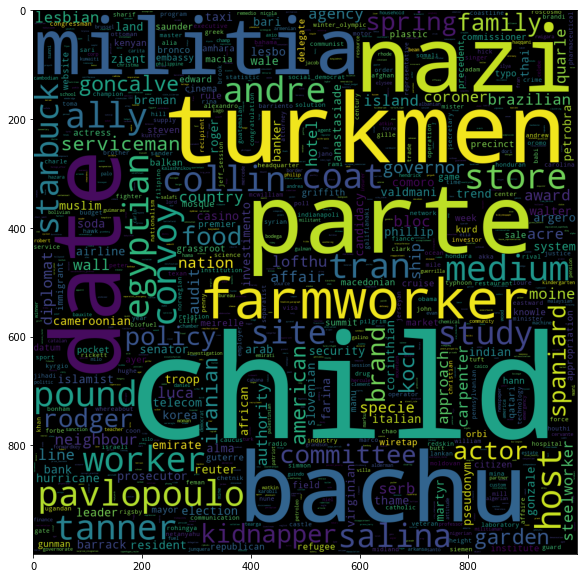

In [28]:
import wordcloud as wc
import matplotlib.pyplot as plt

mycloud = wc.WordCloud(max_words=1000,relative_scaling=1,width=1000,height=1000).generate(output)
plt.figure(figsize=(15,10))
plt.imshow(mycloud)

In [29]:
# [print(d) for d in bdocs]
# print(bdocs)
# print(collection)

In [30]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.corpora import Dictionary
from gensim.models import LdaModel

#Bag of Words#

In [31]:
dictionary = Dictionary(bdocs)
dictionary.filter_extremes(keep_n = 10000, no_above= 0.8, no_below = len(bdocs)*.01)

corpus_bof=[dictionary.doc2bow(d) for d in bdocs]

#Hyper Parameters#

In [32]:
K=[20,25,30,35]
alpha=['symmetric']
eta=['symmetric']
passes=[100]
cv=[]
vocab = list(dictionary.values())
print('# of docs: %5d # of words: %6d'%(dictionary.num_docs, len(vocab)))
for k in K:
  for a in alpha:
    for b in eta:
      for p in passes:
        lda = LdaModel(corpus = corpus_bof,num_topics= k, random_state= 27644437, id2word = dictionary, alpha = a, eta=b,per_word_topics = True,passes = p)
        lda_cv = CoherenceModel(model=lda, texts= bdocs, dictionary=dictionary, coherence='c_v')
        cv_cohe=lda_cv.get_coherence()
        print('K: %2d alfa: %10s beta: %10s passes: %3d coherence: %.3f'%(k,a,b,p,cv_cohe))
        cv.append(cv_cohe)

# of docs: 11673 # of words:    939
K: 20 alfa:  symmetric beta:  symmetric passes: 100 coherence: 0.523
K: 25 alfa:  symmetric beta:  symmetric passes: 100 coherence: 0.524
K: 30 alfa:  symmetric beta:  symmetric passes: 100 coherence: 0.532
K: 35 alfa:  symmetric beta:  symmetric passes: 100 coherence: 0.504


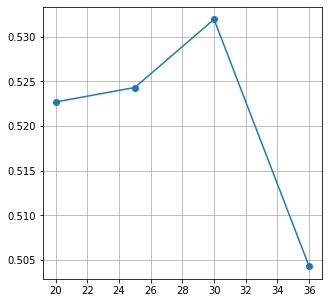

(0.5319283342801736, 30)


In [33]:
plt.figure(figsize=(5,5))
plt.plot((20,25,30,36),cv,marker='o')
plt.grid(True)
plt.show()
print(max(zip(cv,list(K))))

In [34]:
# print(dictionary)
vocab = list(dictionary.values())
# [print(v) for v in dictionary.values()]
# print('# of docs: %5d # of words: %6d'%(dictionary.num_docs, len(vocab)))

#Topics#

In [35]:
best_number_of_topics = 25

In [37]:
cv =[]
lda = LdaModel(corpus = corpus_bof,num_topics= best_number_of_topics, random_state= 27644437, id2word = dictionary, alpha ='symmetric', eta='symmetric',per_word_topics = True,passes = p)
lda_cv = CoherenceModel(model=lda, texts= bdocs, dictionary=dictionary, coherence='c_v')
cv_cohe=lda_cv.get_coherence()
print('K: %2d alfa: %10s beta: %10s passes: %3d coherence: %.3f'%(k,a,b,p,cv_cohe))
cv.append(cv_cohe)

K: 35 alfa:  symmetric beta:  symmetric passes: 100 coherence: 0.524


In [38]:
for i,d in enumerate(corpus_bof):
  print(bdocs[i],':',lda.get_document_topics(d,minimum_probability=0.4)) 

Streaming output truncated to the last 5000 lines.
['moscow_reuters', 'russian', 'foreign_minister', 'sergei_lavrov', 'north_korean', 'crisis', 'secretary_state', 'tillerson', 'meeting', 'vienna', 'week', 'news_agency', 'deputy_foreign', 'minister_sergei', 'ryabkov'] : [(22, 0.46513027)]
['santiago', 'reuters', 'leader', 'influential', 'leftist', 'bloc', 'chile', 'center', 'presidential_hopeful', 'alejandro_guillier', 'monday', 'conservative', 'sebastian_pinera', 'week', 'election', 'beatriz', 'sanchez', 'flagbearer', 'hard', 'frente', 'amplio', 'coalition', 'pinera', 'suggestion', 'ballot', 'round', 'election', 'mind', 'quiet', 'line', 'today', 'sebastian_pinera', 'sanchez', 'journalist', 'vote', 'alejandro_guillier', 'sanchez', 'voter', 'essential', 'guillier', 'triumph', 'pinera', 'second_round', 'vote', 'frente', 'amplio', 'presidential_candidate', 'sanchez', 'twice', 'vote', 'opinion_poll', 'point', 'short', 'election', 'pinera', 'unclear', 'sanchez', 'somewhat', 'reluctant', 'end

In [39]:
tops=[]
for k in range(best_number_of_topics):
    t=[]
    for wt in lda.show_topic(k):
      t.append(wt[0])
    tops.append(t)
for t in tops:
  topic_coher=CoherenceModel(topics=[t], texts= bdocs, dictionary=dictionary, coherence='c_v')
  print('topic:',t)
  print('C_v:%.3f'%(topic_coher.get_coherence()))
print("All:")
topic_coher=CoherenceModel(topics=tops, texts= bdocs, dictionary=dictionary, coherence='c_v')
print('C_v:%.3f'%(topic_coher.get_coherence()))
# top topics
print('Topics with the highest coherence score the coherence for each topic.')
lda.top_topics(corpus=corpus_bof,dictionary=dictionary,coherence='c_v',texts=bdocs,topn=5)

topic: ['turkey', 'turkish', 'erdogan', 'ankara', 'embassy', 'president_tayyip', 'ankara_reuters', 'camp', 'united_states', 'coast']
C_v:0.435
topic: ['company', 'year', 'percent', 'business', 'bank', 'plan', 'rule', 'financial', 'market', 'firm']
C_v:0.396
topic: ['people', 'year', 'country', 'reuters', 'home', 'official', 'time', 'child', 'area', 'government']
C_v:0.340
topic: ['obama', 'white_house', 'president', 'president_barack', 'washington_reuters', 'american', 'americans', 'administration', 'nomination', 'nominee']
C_v:0.423
topic: ['official', 'letter', 'agency', 'government', 'committee', 'senior', 'washington_reuters', 'state_department', 'information', 'report']
C_v:0.324
topic: ['iran', 'deal', 'agreement', 'iranian', 'lebanon', 'tehran', 'nuclear', 'sanction', 'united_states', 'international']
C_v:0.456
topic: ['french', 'france', 'tillerson', 'macron', 'paris', 'secretary_state', 'italy', 'european', 'reuters', 'president_emmanuel']
C_v:0.506
topic: ['court', 'case', 'p

[([(0.1554011, 'russia'),
   (0.1280923, 'russian'),
   (0.051751334, 'putin'),
   (0.051320218, 'moscow'),
   (0.038234353, 'moscow_reuters')],
  0.9581909102725629),
 ([(0.16897498, 'turkey'),
   (0.09627105, 'turkish'),
   (0.064004324, 'erdogan'),
   (0.037401177, 'ankara'),
   (0.03413411, 'embassy')],
  0.8512208503542776),
 ([(0.055929467, 'republican'),
   (0.055079818, 'senate'),
   (0.050754122, 'bill'),
   (0.03569355, 'house'),
   (0.02866183, 'legislation')],
  0.8506736584470161),
 ([(0.085909985, 'court'),
   (0.0537901, 'case'),
   (0.031889014, 'prosecutor'),
   (0.031184232, 'lawyer'),
   (0.028456187, 'supreme_court')],
  0.8448101302268848),
 ([(0.10963995, 'french'),
   (0.09995894, 'france'),
   (0.08761714, 'tillerson'),
   (0.08056924, 'macron'),
   (0.07675882, 'paris')],
  0.825823179878584),
 ([(0.05626082, 'islamic_state'),
   (0.0415191, 'militant'),
   (0.037316944, 'syria'),
   (0.03573811, 'syrian'),
   (0.03494918, 'government')],
  0.8003431774386298),

#Hottest Topics#

[9, 21, 15, 14, 17, 1, 22, 20, 18, 2]


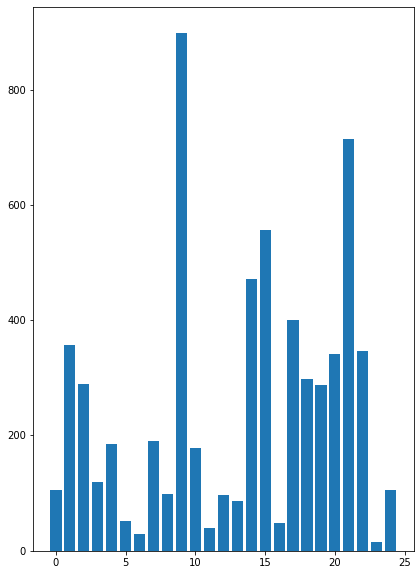

In [40]:
plt.figure(figsize=(15,10))
tops_frequency=[0]*best_number_of_topics
tops_f=[0]*25
x=0

for d in corpus_bof:
  aux=lda.get_document_topics(d,minimum_probability=0.4)
  if aux!=[]:
    tops_frequency[aux[0][0]]+=1
plt.subplot(1, 2, 1)
plt.bar(range(best_number_of_topics),tops_frequency)

for i in range(best_number_of_topics):
  aux1=[tops_frequency[i],i]
  tops_frequency[i]=aux1
tops_frequency.sort()
tops_frequency.reverse()
# print(tops_frequency)

aux2=[0]*10
for i in range(10):
  aux2[i]=tops_frequency[i][1]
print(aux2)
plt.show()

In [41]:
for i in aux2:
  print(lda.show_topics(num_topics=best_number_of_topics)[i])

(9, '0.246*"trump" + 0.059*"president_donald" + 0.037*"white_house" + 0.029*"president" + 0.028*"washington_reuters" + 0.020*"donald_trump" + 0.012*"administration" + 0.012*"campaign" + 0.012*"friday" + 0.011*"president_elect"')
(21, '0.056*"republican" + 0.055*"senate" + 0.051*"bill" + 0.036*"house" + 0.029*"legislation" + 0.029*"lawmaker" + 0.028*"washington_reuters" + 0.025*"committee" + 0.024*"vote" + 0.023*"congress"')
(15, '0.042*"britain" + 0.042*"party" + 0.040*"government" + 0.035*"parliament" + 0.026*"prime_minister" + 0.024*"british" + 0.021*"minister" + 0.020*"coalition" + 0.020*"european_union" + 0.018*"london_reuters"')
(14, '0.059*"election" + 0.049*"percent" + 0.044*"party" + 0.043*"clinton" + 0.028*"candidate" + 0.028*"campaign" + 0.027*"poll" + 0.023*"vote" + 0.023*"republican" + 0.021*"voter"')
(17, '0.106*"north_korea" + 0.033*"japan" + 0.031*"united_nations" + 0.030*"united_states" + 0.024*"security_council" + 0.024*"sanction" + 0.023*"south_korea" + 0.022*"north_k

#Labeling#

In [97]:
ddd=[]
for j in aux2:
  ddd2=[]
  for i,d in enumerate(corpus_bof):
    if len(ddd)<10:
      aux=lda.get_document_topics(d,minimum_probability=0.5)
    else:
      aux=lda.get_document_topics(d,minimum_probability=0.3)
    if aux!=[]:
      if aux[0][0]==j:
        ddd2.append(i)
        # print(aux[0],':',i,bdocs[i])
  ddd.append(ddd2)

In [98]:
for i in ddd:
  print(len(i),end=" ")

490 510 391 332 250 156 200 201 159 114 

In [99]:
df.head()

,text
0,"The following statements were posted to the verified Twitter accounts of U.S. President Donald Trump, @realDonaldTrump and @POTUS. The opinions expressed are his own. Reuters has not edited the statements or confirmed their accuracy. @realDonaldTrump : - While the Fake News loves to talk about my so-called low approval rating, @foxandfriends just showed that my rating on Dec. 28, 2017, was approximately the same as President Obama on Dec. 28, 2009, which was 47%...and this despite massive negative Trump coverage & Russia hoax! [0746 EST] - Why is the United States Post Office, which is losing many billions of dollars a year, while charging Amazon and others so little to deliver their packages, making Amazon richer and the Post Office dumber and poorer? Should be charging MUCH MORE! [0804 EST] -- Source link: (bit.ly/2jBh4LU) (bit.ly/2jpEXYR)"
1,"The following statements were posted to the verified Twitter accounts of U.S. President Donald Trump, @realDonaldTrump and @POTUS. The opinions expressed are his own. Reuters has not edited the statements or confirmed their accuracy. @realDonaldTrump : - Together, we are MAKING AMERICA GREAT AGAIN! bit.ly/2lnpKaq [1814 EST] - In the East, it could be the COLDEST New Year’s Eve on record. Perhaps we could use a little bit of that good old Global Warming that our Country, but not other countries, was going to pay TRILLIONS OF DOLLARS to protect against. Bundle up! [1901 EST] -- Source link: (bit.ly/2jBh4LU) (bit.ly/2jpEXYR)"
2,"WASHINGTON (Reuters) - Alabama Secretary of State John Merrill said he will certify Democratic Senator-elect Doug Jones as winner on Thursday despite opponent Roy Moore’s challenge, in a phone call on CNN. Moore, a conservative who had faced allegations of groping teenage girls when he was in his 30s, filed a court challenge late on Wednesday to the outcome of a U.S. Senate election he unexpectedly lost."
3,"(Reuters) - Alabama officials on Thursday certified Democrat Doug Jones the winner of the state’s U.S. Senate race, after a state judge denied a challenge by Republican Roy Moore, whose campaign was derailed by accusations of sexual misconduct with teenage girls. Jones won the vacant seat by about 22,000 votes, or 1.6 percentage points, election officials said. That made him the first Democrat in a quarter of a century to win a Senate seat in Alabama. The seat was previously held by Republican Jeff Sessions, who was tapped by U.S. President Donald Trump as attorney general. A state canvassing board composed of Alabama Secretary of State John Merrill, Governor Kay Ivey and Attorney General Steve Marshall certified the election results. Seating Jones will narrow the Republican majority in the Senate to 51 of 100 seats. In a statement, Jones called his victory “a new chapter” and pledged to work with both parties. Moore declined to concede defeat even after Trump urged him to do so. He stood by claims of a fraudulent election in a statement released after the certification and said he had no regrets, media outlets reported. An Alabama judge denied Moore’s request to block certification of the results of the Dec. 12 election in a decision shortly before the canvassing board met. Moore’s challenge alleged there had been potential voter fraud that denied him a chance of victory. His filing on Wednesday in the Montgomery Circuit Court sought to halt the meeting scheduled to ratify Jones’ win on Thursday. Moore could ask for a recount, in addition to possible other court challenges, Merrill said in an interview with Fox News Channel. He would have to complete paperwork “within a timed period” and show he has the money for a challenge, Merrill said. “We’ve not been notified yet of their intention to do that,” Merrill said. Regarding the claim of voter fraud, Merrill told CNN that more than 100 cases had been reported. “We’ve adjudicated more than 60 of those. We will continue to do that,” he said. Republican lawmakers in Washington had distanced themselves fro

In [100]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', 1)

lables=[]

#Topic 1#

In [101]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[0]])

(9, '0.246*"trump" + 0.059*"president_donald" + 0.037*"white_house" + 0.029*"president" + 0.028*"washington_reuters" + 0.020*"donald_trump" + 0.012*"administration" + 0.012*"campaign" + 0.012*"friday" + 0.011*"president_elect"')


In [102]:
noticiasaux=df.iloc[ddd[0]]
noticiasaux.head()

,text
4,"The following statements were posted to the verified Twitter accounts of U.S. President Donald Trump, @realDonaldTrump and @POTUS. The opinions expressed are his own. Reuters has not edited the statements or confirmed their accuracy. @realDonaldTrump : - Vanity Fair, which looks like it is on its last legs, is bending over backwards in apologizing for the minor hit they took at Crooked H. Anna Wintour, who was all set to be Amb to Court of St James’s & a big fundraiser for CH, is beside herself in grief & begging for forgiveness! [1024 EST] -- Source link: (bit.ly/2jBh4LU) (bit.ly/2jpEXYR)"
15,"WASHINGTON (Reuters) - A summer spat between President Donald Trump and Senate Majority Leader Mitch McConnell has turned into a warm embrace - and all it took was a sweeping rewrite of the U.S. tax code. For months, McConnell urged the president to lock his cell phone in a drawer and retire his signature tweets that have Washington abuzz on a daily basis. He even chided Trump for having “excessive expectations” of Congress. For his part, Trump scorched McConnell in August for failing to repeal Obamacare, sidestepped reporters’ questions over whether the senator should retire and tweeted, “Mitch, get to work.” But with Congress’ passage of the tax bill this week, giving Trump his first major legislative victory, the president tweeted on Wednesday, “I would like to congratulate @SenateMajLdr on having done a fantastic job.” McConnell joined in the love fest on Friday, or at least what constitutes a love fest for the understated senator. “With regard to the president’s tweeting habits, I haven’t been a fan until this week. I’m warming up to it,” McConnell quipped. Still, he reined in reporters who asked whether he might visit Trump in Mar-a-Lago, the president’s Florida resort, over the Christmas and New Year holidays. McConnell laughed and said he would instead be attending a Dec. 30 football game in Jacksonville, Fla. “That’s the closest I’ll get.”"
56,"WASHINGTON (Reuters) - President Donald Trump, when asked on Sunday if he was considering firing U.S. special counsel Robert Mueller, told reporters, “No. I’m not.” Democratic lawmakers in recent days have expressed concern that Trump might fire Mueller, who is investigating allegations of Russian interference in the 2016 U.S. presidential election and whether Trump or anyone on his team colluded with Moscow. Russia denies meddling in the election and Trump has denied any collusion."
95,"WASHINGTON (Reuters) - Omarosa Manigault Newman, a former reality television star-turned political aide to U.S. President Donald Trump, has resigned from the White House to “pursue other opportunities,” Trump’s spokeswoman Sarah Sanders said on Wednesday. Newman served as assistant to the president and director of communications for the White House’s Office of Public Liaison. A former star of Trump’s TV show “The Apprentice,” Newman worked as the director of African-American outreach on Trump’s 2016 presidential campaign. Sanders said Newman’s departure would take effect Jan. 20, 2018. Newman had what sometimes appeared to be an ambiguous role in the White House orbit. The New York Times reported in September that chief of staff John Kelly had put her on a “no-fly list” of aides who he did not consider fit to attend serious meetings. Sources with ties to the White House have said they expect a wave of departures from the administration once Trump has completed his first year in office."
101,"WASHINGTON (Reuters) - President Donald Trump on Wednesday will host congressional negotiators for lunch to discuss their progress toward tax cut legislation, the White House said. The lunch will take place ahead of a speech on tax cuts Trump is to deliver. “Tomorrow afternoon the president will host the House and Senate conferees for the Tax Cuts and Jobs Act... for lunch at the White House to discuss the progress they have made towards delivering historic tax reform for the American people,” said White Hou

In [103]:
lables.append("President Trump")

#Topic 2#

In [104]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[1]])

(21, '0.056*"republican" + 0.055*"senate" + 0.051*"bill" + 0.036*"house" + 0.029*"legislation" + 0.029*"lawmaker" + 0.028*"washington_reuters" + 0.025*"committee" + 0.024*"vote" + 0.023*"congress"')


In [105]:
noticiasaux=df.iloc[ddd[1]]
noticiasaux.head()

,text
18,"WASHINGTON (Reuters) - Legislation to provide $81 billion in new disaster aid for U.S. states, Puerto Rico and the U.S. Virgin Islands was put on hold by the Senate on Thursday amid attacks from both Republicans and Democrats. The Republican-controlled House of Representatives passed the legislation earlier on Thursday to help recovery efforts stemming from hurricanes and wildfires. But the Senate put off a vote until at least January, according to some lawmakers and aides, after Democrats complained Puerto Rico was not getting enough help and some fiscal hawks fretted about the overall cost."
21,"WASHINGTON (Reuters) - The U.S. House of Representatives on Thursday approved an $81 billion bill to help widespread recovery efforts from hurricanes and wildfires this year. By a vote of 251-169, the House passed the measure to help Puerto Rico, the U.S. Virgin Islands and states rebuild following the natural disasters. The bill now goes to the Senate where it is expected to be approved this week."
23,"WASHINGTON (Reuters) - The U.S. House of Representatives on Thursday took a step toward averting a partial government shutdown at the end of this week, approving rules to debate a bill that would fund federal agencies through Jan. 19. Also cleared for debate was an $81 billion disaster aid bill to help U.S. states, Puerto Rico and the U.S. Virgin Islands recover from a series of recent natural disasters. House votes on both bills were expected later on Thursday."
26,"WASHINGTON (Reuters) - U.S. Democratic Senator Al Franken, who earlier this month announced his plan to resign following sexual misconduct allegations against him, will step down on Jan. 2, a representative for the lawmaker said on Wednesday. The 66-year-old former comedian from Minnesota had been seen as a rising star in the Democratic Party, but faced growing calls from fellow Senate Democrats to step down as allegations against him mounted. Franken is one of several influential men who have lost their jobs after being accused of sexual misconduct, assault or harassment, including Hollywood executive Harvey Weinstein and journalists Matt Lauer, Charlie Rose and Tavis Smiley. He will be the third lawmaker facing misconduct allegations to depart from Congress following Democratic Representative John Conyers and Republican Representative Trent Franks. Two others, Democratic Representative Ruben Kihuen and Republican Representative Blake Farenthold, have said they will not seek re-election next year. Franken has denied some of the allegations against him and questioned others. Reuters has not independently verified any of the allegations. Minnesota’s Democratic governor, Mark Dayton, last week appointed Lieutenant Governor Tina Smith, who is also a Democrat to fill Franken’s seat. Smith, 59, will serve a one-year term concluding in January 2019, Dayton said, and will run in a special election for the seat next November."
35,"WASHINGTON (Reuters) - The U.S. Senate parliamentarian has ruled against three provision of the Republican tax bill, forcing the House of Representatives to hold a second vote on the legislation, Senator Bernie Sanders said on Tuesday. Sanders, an independent on the Senate Budget Committee, said the ruling could mean that provisions related to educational savings accounts for home schooling and private university endowments could be struck from the measure unless 60 members of the Senate vote to uphold them."


In [106]:
lables.append("Policies Decisions")

#Topic 3#

In [107]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[2]])

(15, '0.042*"britain" + 0.042*"party" + 0.040*"government" + 0.035*"parliament" + 0.026*"prime_minister" + 0.024*"british" + 0.021*"minister" + 0.020*"coalition" + 0.020*"european_union" + 0.018*"london_reuters"')


In [108]:
noticiasaux=df.iloc[ddd[2]]
noticiasaux.head()

,text
237,"LONDON (Reuters) - Britain’s ambassador to the United States discussed a row over retweets sent by President Donald Trump with senior White House officials on Wednesday, a British government source said on Thursday. The source, who asked not to be named due to the sensitivity of the issue, did not give further details of the discussion. Trump has sparked outrage in Britain’s political establishment with a sharp rebuke of Prime Minister Theresa May on Twitter after she criticised him for retweeting British far-right anti-Islam videos."
239,"LONDON (Reuters) - British Prime Minister Theresa May is fully focused on tackling extremism, her spokesman said on Thursday, responding to a tweet by U.S. President Donald Trump telling her to focus on “destructive Radical Islamic Terrorism”. Asked if May was focused on tackling extremism: her spokesman said: “Yes.” “The overwhelming majority of Muslims in this country are law-abiding people who abhor extremism in all its forms. The prime minister has been clear ... that where Islamist extremism does exist it should be tackled head on. We are working hard to do that both at home and internationally and ... with our U.S. partners.”"
240,"LONDON (Reuters) - British interior minister Amber Rudd said on Thursday she hoped Britain’s condemnation of U.S. President Donald Trump for retweeting material from a British far-right group would have an impact. “I think we all listen more carefully, perhaps, to criticism from our friends than from people who we don’t have a relationship with. So, I hope that the prime minister’s comments will have some impact on the president,” Rudd told parliament. British Prime Minister Theresa May said on Wednesday that Trump was wrong to have retweeted posts from the Britain First group."
1693,"LONDON (Reuters) - Prime Minister Theresa May’s office said on Sunday there had been no change to plans for U.S. President Donald Trump’s to come to Britain on a state visit, after the Guardian newspaper reported the trip had been postponed. The paper, citing an unidentified adviser at May’s Downing Street office who was in the room at the time, reported Trump had told May by telephone in recent weeks that he did not want to come if there were likely to be large-scale protests. “We aren’t going to comment on speculation about the contents of private phone conversations,” a spokeswoman for May’s office said. “The queen extended an invitation to President Trump to visit the UK and there is no change to those plans.” The White House also denied the Guardian report, with an administration official telling Reuters, “The subject never came up on the call.” No date has been set for the visit, which was agreed during May’s visit to Washington in January, but British media had reported it was planned for October. May’s hold on power has been significantly weakened since the results of a snap election last week cost her Conservative Party a parliamentary majority. In a bid to save her position, May has been trying to form a government with Northern Ireland’s Democratic Unionist Party, a small faction of social conservatives. British politics is going through an upheaval just a week before talks begin on Britain’s exit from the European Union, set for 2019. Trump’s public criticism this month of London Mayor Sadiq Khan’s response to an attack by Islamist militants in London was condemned in Britain. May found herself forced to defend Khan, who is from the opposition Labour party. At that time, Foreign Secretary Boris Johnson said there was no reason to cancel the visit, while White House spokesman Sean Spicer said that Trump intended to go and that “he appreciates Her Majesty’s gracious invitation”."
1791,"LONDON (Reuters) - British Prime Minister Theresa May told President Donald Trump that she was “disappointed” by his decision to pull the United States out of the Paris climate accord, Downing Street said after a call between the leaders on Thursday. “The Prime Minister expre

In [109]:
lables.append("Europe News")

#Topic 4#

In [110]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[3]])

(14, '0.059*"election" + 0.049*"percent" + 0.044*"party" + 0.043*"clinton" + 0.028*"candidate" + 0.028*"campaign" + 0.027*"poll" + 0.023*"vote" + 0.023*"republican" + 0.021*"voter"')


In [111]:
noticiasaux=df.iloc[ddd[3]]
noticiasaux.head()

,text
410,"WASHINGTON (Reuters) - Democrat Ralph Northam was elected on Tuesday as Virginia’s next governor, U.S. media projected, handing his party a sorely needed victory and beating back a challenge from a Republican opponent who embraced President Donald Trump’s combative campaign style. Northam, the state’s lieutenant governor, had seen his lead in the opinion polls diminish late in the race in the face of hard-edged ads by Republican Ed Gillespie touching on divisive issues such as immigration, gang crime and Confederate statues."
772,"SACRAMENTO, Calif. (Reuters) - California will move its presidential primary from June to March under a bill signed on Wednesday by Democratic Governor Jerry Brown, a change aimed at giving the liberal-leaning state more influence in choosing candidates from either national party. The most populous U.S. state, which voted heavily for Democrat Hillary Clinton in November’s presidential election, has traditionally held its primary so late that Democratic and Republican voters in other states had essentially already chosen their parties’ candidates. “The Golden State will no longer be relegated to last place in the presidential nominating process,” said Secretary of State Alex Padilla, a Democrat who backed the change, in a statement. “Candidates will not be able to ignore the largest, most diverse state in the nation as they seek our country’s highest office.” The bill was passed mostly along party lines in the majority-Democrat legislature. The new date will leave the Iowa caucuses and the New Hampshire primary in place as the first and second contests of the presidential election cycle, during which voters in each state choose the candidate they would like their party to nominate for president. Because California’s primary has been in June while others were held earlier, candidates have largely ignored the state, spending less on outreach than elsewhere, making fewer visits, and failing to prioritize California voters’ concerns in their campaigns, supporters said. In 2016, California Democrats chose Clinton and Republicans opted for Donald Trump, the populist businessman who ultimately won the presidency. Backers in the legislature said the early primary would lead to less divisive choices by members of both major parties in the 2020 election cycle, and establish California as a leading voice in the choice of candidates. Progressive Democrats also believe that moving the primary up could result in their party’s selection of more liberal candidates. “California is the beating heart of the national resistance to Trump, and California Democrats are defining the progressive agenda for America,” state Democratic Party Chairman Eric Bauman said in a press release. “When it comes to deciding the Democratic nominee, our voices need to be heard early in the process.”"
1075,"WASHINGTON (Reuters) - Former Democratic presidential candidate Hillary Clinton says in her new book that Donald Trump made her skin crawl by stalking her around the stage in a campaign debate and she wonders if she should have told him to “back up, you creep.” In audio excerpts of the book “What Happened” aired on Wednesday on MSNBC, Clinton described her 2016 campaign as “joyful, humbling, infuriating and just plain baffling” and acknowledged she failed her millions of supporters by losing to Trump in the November election. In the excerpts, Clinton described the Oct. 9 debate in St. Louis in which Trump followed her closely about the stage, lurking behind her as she fielded questions from a live television audience. The debate came two days after an audiotape emerged in which Trump was heard bragging about groping women. “This is not OK, I thought,” Clinton says. “It was the second presidential debate and Donald Trump was looming behind me. “We were on a small stage and no matter where I walked, he followed me closely, staring at me, making faces. It was incredibly uncomfortable. He was literally breathing down my neck. My ski

In [112]:
lables.append("Vote Intention")

#Topic 5#

In [113]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[4]])

(17, '0.106*"north_korea" + 0.033*"japan" + 0.031*"united_nations" + 0.030*"united_states" + 0.024*"security_council" + 0.024*"sanction" + 0.023*"south_korea" + 0.022*"north_korean" + 0.020*"pyongyang" + 0.018*"resolution"')


In [115]:
noticiasaux=df.iloc[ddd[4]]
noticiasaux.head()

,text
322,"COLORADO SPRINGS, Colo. (Reuters) - U.S. Defense Secretary Jim Mattis said on Thursday there could be an opportunity for talks between North Korea and the United States if Pyongyang stopped testing and developing its nuclear and missile programs. “So long as they stop testing, stop developing, they don’t export their weapons, there would be opportunity for talks,” Mattis told reporters on a military plane. While Washington has said that all options, including military, are on the table in dealing with North Korea, it has stressed its preference is for a diplomatic solution. Visiting Seoul last week, U.S. President Donald Trump warned North Korea he was prepared to use the full range of American military power to stop any attack, but also urged Pyongyang to “make a deal.” Trump, who had previously called negotiations with North Korea a waste of time, has offered no clear path to talks. Pyongyang has made clear it has little interest in negotiations, at least until it has developed a nuclear-tipped missile capable of hitting the U.S. mainland. The last North Korean missile test was carried out almost two months ago, but U.S. officials say they have seen no signs that Pyongyang has stopped development. Mattis said the U.S. military was closely watching why there had been no missile launches recently, but declined to give potential reasons for it. There are concerns in South Korea that any potential U.S. strikes against North Korea’s nuclear and missile programs could provoke devastating North Korean retaliation against South Korea. Earlier this week, a senior South Korean official said Trump should “under no circumstances” take military action against North Korea without the consent of the government in Seoul. In Colorado, Mattis will visit the U.S. Northern Command and the North American Aerospace Defense Command (NORAD), which are responsible for homeland defense, including tracking and potentially intercepting North Korean missiles."
427,"BEIJING (Reuters) - China said on Monday that it hopes all sides’ words and actions can help reduce tensions on the Korean peninsula, after Japanese Prime Minister Shinzo Abe said Japan would shoot down North Korean missiles if necessary. Foreign Ministry spokeswoman Hua Chunying made the comment at a regular news briefing."
437,"GENEVA (Reuters) - North Korea called on Friday for a halt to what it called “brutal sanctions”, saying the measures - imposed after its latest nuclear test - constituted genocide. “Today the U.S.-led racket of brutal sanctions and pressure against the DPRK constitutes contemporary human rights violation and genocide,” the North Korean mission to the United Nations in Geneva said in a statement. The sanctions regime “threatens and impedes the enjoyment by the people of DPRK of their human rights in all sectors”, it said. The call for an immediate end to the sanctions comes as U.S. President Donald Trump sets off on a trip to Asia - including China, South Korea and Japan - looking for help to pressure North Korea to stand down from the nuclear crisis. The global community has been ramping up the pressure on the isolated country after it conducted its sixth and most powerful nuclear test so far, on Sept. 3. Last month the United States unilaterally imposed sanctions on seven North Korean individuals and three entities over what it called serious human rights abuses, including forced labor. In September the U.N. Security Council strengthened its sanctions, including export bans as well as asset freezes and travel bans on various officials, North Korea’s response follows a U.N. expert last month saying international sanctions may be hurting key economic sectors and hampering the human rights of Pyongyang’s citizens. The sanctions meant that “some unprincipled countries have blocked the delivery of medical equipment and medicines”, the North Korean mission said on Friday, with the supplies destined for children and mothers in the country. “All types of anti-hum

In [116]:
lables.append("Koreas News")

#Topic 6#

In [117]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[5]])

(1, '0.038*"company" + 0.036*"year" + 0.029*"percent" + 0.021*"business" + 0.016*"bank" + 0.013*"plan" + 0.012*"rule" + 0.011*"financial" + 0.011*"market" + 0.011*"firm"')


In [118]:
noticiasaux=df.iloc[ddd[5]]
noticiasaux.head()

,text
11,"WASHINGTON (Reuters) - U.S. financial regulators said on Friday that because the new tax bill could make timely financial reporting difficult, public companies can make reasonable estimates when uncertain of the impact of the new tax law in financial reports, and will have up to a year to report final numbers. The Securities and Exchange Commission bulletin comes after the U.S. Chamber of Commerce warned on Thursday that some U.S. listed companies may struggle to file their annual financial reports on time because the Republican-led overhaul of the country’s tax system may prompt a raft of additional disclosures. In a statement on the Tax Cuts and Jobs Act (TJCA) issued on Friday, SEC Chairman Jay Clayton and Commissioners Kara Stein and Michael Piwowar said guidance was similar to that given in the past when tax law changes affected financial reporting. The $1.5 trillion tax bill, signed into law on Friday by U.S. President Donald Trump, will significantly affect many companies’ year-end financial statements because listing rules oblige them to flag any potential material risks or changes to their operations and financial outlook to shareholders. The bill significantly lowers the income tax rate for U.S. companies - to 21 percent from 35 percent - allows them to repatriate cash from overseas, and modifies numerous deductions, among other changes. Public companies have been given a “measurement period” to study the changes created by a new law. During the measurement period, the SEC expects companies to complete their accounting and that “in no circumstances should the measurement period extend beyond one year from the enactment date,” of the TJCA. Companies will also need to make disclosures during the measurement period, including any updates to provisional amounts given earlier, or newly discovered reporting implications from tax bill. For companies with fiscal years ending Dec. 31, getting the necessary analysis done in time could be tough, the Chamber said. The tax bill It is the largest such overhaul since the 1980. In addition to slashing the corporate rate, it temporarily reduces the tax burden for most individuals."
38,"WASHINGTON (Reuters) - A coalition of nearly 20 environmental and Native American tribal groups sued the Trump administration on Tuesday, challenging its delay of a rule limiting emissions of the powerful greenhouse gas methane from oil and gas drilling operations on federal lands. Earlier this month, the Bureau of Land Management, part of the Department of the Interior, suspended implementation of the rule for a year, until Jan. 17, 2019, saying it wanted to avoid compliance costs for energy companies as it revises the regulation. The delay “is yet another action taken by the Trump administration to benefit the oil and gas industry at the expense of the American public, particularly the millions of Westerners” who use public lands for ranching, hunting, hiking and other purposes, Darin Schroeder, a lawyer with the Clean Air Task Force, said in a statement. His organization represented the National Wildlife Federation, one of the groups that filed the lawsuit against Interior Secretary Ryan Zinke and his department. Energy companies say the rule, finalized at the end of the Obama administration in 2016, could cost them tens of thousands of dollars per well. The Trump administration is expected to announce a new draft rule in coming weeks, in line with its policy of maximizing output of oil, gas and coal and dismantling regulations it says prevent job growth. The rule targets accidental leaks and intentional venting of methane from drilling operations on public lands, where about 9 percent of the country’s natural gas and 5 percent of its oil were produced last fiscal year. Some of its 2017 provisions have already been phased in, but the majority of them have yet to go into effect. The lawsuit, also filed by the Sierra Club, the Environmental Defense Council, and the Diné Citizens Against Ruin

In [119]:
lables.append("Money")

#Topic 7#

In [120]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[6]])

(22, '0.155*"russia" + 0.128*"russian" + 0.052*"putin" + 0.051*"moscow" + 0.038*"moscow_reuters" + 0.024*"president_vladimir" + 0.023*"ukraine" + 0.017*"kremlin" + 0.016*"syria" + 0.015*"united_states"')


In [121]:
noticiasaux=df.iloc[ddd[6]]
noticiasaux.head()

,text
351,"MOSCOW (Reuters) - The Kremlin said on Sunday that inflexibility on the part of the United States was to blame for the lack of a bilateral meeting between Russia’s President Vladimir Putin and U.S. President Donald Trump during a summit in Vietnam. Trump and Putin met briefly on the sidelines of the Asia-Pacific Economic Cooperation summit in Vietnam on Saturday and agreed on a joint statement supporting a political solution for Syria, but did not hold substantive bilateral talks. “Unfortunately the American side did not offer any alternatives despite all efforts of our Russian colleagues. There was only one time offered that was convenient for the American side, and only one place offered, which had already been rented by the Americans,” Kremlin spokesman Dmitry Peskov was quoted as saying by the RIA news agency. “The Americans showed no flexibility, and unfortunately did not offer any other alternative proposals. That is why the meeting could not happen,” Peskov added. Putin himself said on Saturday the lack of a bilateral meeting with Trump in Vietnam was due to both leaders’ schedules and protocol obstacles that their teams had been unable to overcome. Allegations that Trump’s election campaign colluded with Moscow last year to turn voters away from Democratic candidate Hillary Clinton have hampered the president’s efforts to improve frosty U.S.-Russian relations. Putin renewed his denial of the allegations during his brief meeting with Trump on Saturday. Trump has previously said the accusations of collusion were a hoax."
403,"MOSCOW (Reuters) - Russian Deputy Foreign Minister Sergei Ryabkov said on Wednesday that Moscow has never supported the imposition of a complete embargo on North Korea, RIA news agency reported. Ryabkov added that attempts by the United States to resolve all problems with sanctions were extremely alarming and that the crisis around North Korea would be addressed in President Vladimir Putin’s meeting with U.S. counterpart Donald Trump. Ryabkov said there was no clarity when the meeting will take place, RIA reported. Russian officials have said Putin and Trump would meet at the Asia-Pacific Economic Cooperation forum in Vietnam this week."
485,"MOSCOW (Reuters) - Allegations of Russian meddling in elections in the United States and Europe are “fantasies”, the Interfax news agency cited Russian Foreign Minister Sergei Lavrov as saying on Tuesday. “Without a single piece of proof, we are as you know being accused of meddling not only in the U.S. election, but also in those in European states,” the agency quoted Lavrov as telling a briefing at the Association of European Businesses in Russia. “Recently, there was an allegation that Moscow decided what minister to appoint in South Africa. In general, there is no limit to fantasy.”"
511,"MOSCOW (Reuters) - Russia said on Thursday it would respond to a decision by Twitter Inc to ban adverts from media outlets Russia Today (RT) and Sputnik, saying the move flouted international and domestic laws on free speech, the RIA news agency reported. RIA cited the Russian Foreign Ministry as saying the decision was another aggressive step aimed at hindering the work of Russian media in the United States and the result of pressure from U.S. intelligence agencies."
733,"MOSCOW (Reuters) - The Kremlin said on Tuesday it hoped that President Donald Trump’s new ambassador to Russia, Jon Huntsman, could help breathe new life into battered U.S.-Russia relations. Kremlin spokesman Dmitry Peskov made the comments to reporters in a conference call ahead of Huntsman presenting his diplomatic credentials to President Vladimir Putin later on Tuesday. “We hope that, headed by the new ambassador, the U.S. diplomatic mission to Russia will be able to significantly contribute to repairing the damage done by Washington’s actions to our relations,” said Peskov. Former Utah governor Jon Huntsman, an experienced diplomat, was confirmed as ambassador by the U.S. Senate at the en

In [122]:
lables.append("Russia News")

#Topic 8#

In [123]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[7]])

(20, '0.056*"islamic_state" + 0.042*"militant" + 0.037*"syria" + 0.036*"syrian" + 0.035*"government" + 0.027*"attack" + 0.026*"iraq" + 0.024*"force" + 0.020*"group" + 0.019*"region"')


In [124]:
noticiasaux=df.iloc[ddd[7]]
noticiasaux.head()

,text
609,"WASHINGTON (Reuters) - The United States sought on Monday to avoid openly taking sides in an Iraqi-Kurdish dispute, as Iraq’s capture of the Kurdish-held city of Kirkuk raised the risk of an open conflict between U.S. allies in the fight against Islamic State. U.S. President Donald Trump expressed disappointment the two sides were fighting. “We don’t like the fact that they’re clashing. We’re not taking sides,” Trump told reporters at the White House. “We’ve had for many years a very good relationship with the Kurds as you know and we’ve also been on the side of Iraq, even though we should have never been there in the first place. We should never have been there. But we’re not taking sides in that battle.” Iraqi government forces captured the major Kurdish-held oil city of Kirkuk on Monday, responding to a Kurdish referendum on independence with a bold lightning strike that transforms the balance of power in the country. A convoy of armored vehicles from Iraq’s elite U.S.-trained Counter-Terrorism Force seized Kirkuk’s provincial government headquarters on Monday afternoon, less than a day after the operation began, a Reuters reporter in Kirkuk said. Senator John McCain, the influential chairman of the Senate Armed Services Committee, warned Iraq’s government of “severe consequences” over any further misuse of U.S.-provided weaponry against Kurdish forces. Pentagon spokesman Colonel Robert Manning declined to speculate on whether the United States might cut off military aid and training to Iraqi forces in the event a major conflict, saying: “I’m not going to speculate on that but I will tell you that we’re looking at all options for planning considerations ... We encourage dialogue.”"
628,"WASHINGTON (Reuters) - U.S. Defense Secretary Jim Mattis said on Friday that tensions between Kurdish and Iraqi forces in and around Kirkuk had the full attention of the United States, which was working to ensure it does not escalate. Kurdish authorities said they have sent thousands more troops to Kirkuk to confront “threats” of Iraqi military attack, but also pulled back defense lines around the disputed oil-producing area slightly to ease tensions. “We have got to work on this, the secretary of state has the lead, but my forces are integrated among these forces and they are working too, to make certain we keep any potential for conflict off the table,” Mattis told reporters. The Baghdad central government has taken a series of steps to isolate the autonomous Kurdish region since its overwhelming vote for independence in a Sept. 25 referendum, including banning international flights from going there. Mattis said while he was aware of troop movements, he had not heard of any fighting and called on both sides to focus on fighting Islamic State militants. “We can’t turn on each other right now. We don’t want this to go to a shooting situation,” Mattis added. Kirkuk, a city of more than 1 million people, lies just outside Kurdish territory, but Peshmerga forces deployed there in 2014 when Iraqi security forces collapsed in the face of an Islamic State onslaught. The Peshmerga deployment prevented Kirkuk’s oil fields from falling into jihadist hands. As the territory controlled by Islamic State has shrunk, ethnic and sectarian fractures that have plagued Iraq for more than a decade have once again started to resurface. The group’s last territory in Iraq is now a stretch skirting the western border with Syria following the fall of the town of Hawija and surrounding areas on Oct. 5 in an offensive by U.S.-backed Iraqi forces. Mattis said the differences would have to be worked out politically and not on the battlefield. “These are issues that are longstanding in some cases. ... We’re going to have to recalibrate and move these back to a way (where) we solve them politically and work them out with compromised solutions,” he said."
1083,"BAGHDAD (Reuters) - Iraqi forces breached on Tuesday the city limits of Tal Afar, an Islamic State st

In [125]:
lables.append("Middle East")

#Topic 9#

In [126]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[8]])

(18, '0.039*"country" + 0.039*"united_states" + 0.020*"meeting" + 0.019*"mexico" + 0.018*"trade" + 0.018*"leader" + 0.015*"issue" + 0.015*"talk" + 0.014*"spain" + 0.014*"visit"')


In [127]:
noticiasaux=df.iloc[ddd[8]]
noticiasaux.head()

,text
345,"MANILA (Reuters) - U.S. President Donald Trump said on Monday he had made significant progress on trade issues during a fruitful trip across Asia that saw governments roll out red carpets “like nobody has ever seen”. “We’ve made some very big steps with respect to trade, far bigger than anything you know,” Trump told reporters in Manila on the sidelines of a summit with leaders of Southeast Asian and East Asian nations. He did not give details of his achievements on trade matters during a tour that took him to Japan, South Korea, China and Vietnam before his last leg in the Philippines capital. He said a statement would be issued from the White House on Wednesday about North Korea, and on trade, key issues of a trip he described as fruitful. “It was red carpet like nobody, I think, has probably ever seen,” he said. In Vietnam at the weekend, Trump and leaders of Pacific Rim nations agreed to address “unfair trade practices” and “market- distorting subsidies”, a statement that bore the imprint of Trump’s efforts to reshape the global trade landscape. His “America First” vision has upset a traditional consensus favoring multinational trade pacts that China now champions. On the sidelines of the Vietnam meeting, 11 countries kept alive a Trans Pacific trade deal whose future was thrown into doubt when Trump withdrew from it in the name of protecting American jobs. Chinese President Xi Jinping told the summit in Vietnam that Asia-Pacific nations must “uphold multilateralism”, countering Trump’s message that the United States would stay out of trade deals that surrender its sovereignty. Trump, by contrast, blasted the World Trade Organization and multilateral trade deals during his tour. Some analysts expect tougher U.S. action may be imminent to fight trade imbalances with China exacerbated by its state-led economic model."
647,"WASHINGTON (Reuters) - Mexican Finance Minister Jose Antonio Meade said on Friday that Mexico’s peso was reacting with volatility to “tension” in NAFTA talks, but Mexico wanted to reach a consensus to modernize the trade pact to benefit all three member countries. Meade, speaking on the sidelines of the International Monetary Fund meeting in Washington, said that Mexico was benefiting from a flexible and liquid exchange rate. The peso was hovering near a five-month low on Friday. “The main scenario that we’re working on is that there is scope in the negotiation of the agreement for a consensus that benefits the three countries. That’s what’s driving us in a negotiation we’re taking part in good faith,” Meade said."
649,"MEXICO CITY (Reuters) - Mexico would keep trading with Canada under the North American Free Trade Agreement (NAFTA) even if the United States opts to abandon the pact, Mexico’s economy minister said on Friday, as a fourth round of talks proceeded near Washington. “NAFTA, by itself, will not collapse,” said Ildefonso Guajardo, speaking on a Mexican television panel with Canada’s international trade minister François-Philippe Champagne. “The possibility is that the United States leaves the treaty, but the treaty itself would keep regulating relations between Canada and Mexico,” Guajardo said. Tensions between the three trade partners have increased after President Donald Trump said on Wednesday he would be open to bilateral deals with Mexico and Canada, and warned again that he might terminate the pact altogether. A U.S. proposal to add a so-called “sunset clause” to force negotiations every five years has also triggered unease over NAFTA’s future. Guajardo and Champagne pushed back against the idea on Friday, saying a sunset clause should not be part of the modernized treaty. Champagne said a sunset clause would cause uncertainty. “We don’t need a sunset clause,” he said. “We need to take a long-term view.” Another point of discord emerged on Friday as U.S. negotiators disclosed proposals to mandate that at least half of the content of autos that benefit from NAFTA must be made in

In [128]:
lables.append("Mexico Policies")

#Topic 10#

In [129]:
print(lda.show_topics(num_topics=best_number_of_topics)[aux2[9]])

(2, '0.054*"people" + 0.040*"year" + 0.021*"country" + 0.018*"reuters" + 0.016*"home" + 0.015*"official" + 0.013*"time" + 0.012*"child" + 0.012*"area" + 0.012*"government"')


In [130]:
noticiasaux=df.iloc[ddd[9]]
noticiasaux.head()

,text
987,"HOUSTON (Reuters) - The U.S. Coast Guard on Monday allowed some barge traffic to enter Port Arthur, Texas, home of the country’s largest oil refinery, and is considering allowing ships to enter on Tuesday, a spokesman said. Ships are not yet allowed to enter the port along the Neches River because of extreme river currents from Hurricane Harvey, said Scott Whalen, director of the USCG’s Vessel Tracking Service at Port Arthur. The largest crude oil processor in the United States, Motiva Enterprises’ Port Arthur Refinery, sits along the port. The 603,000 barrel per day refinery is one of the largest producers of gasoline in the United States. Port Arthur, the Port of Beaumont and Port of Orange are deep water ports on the Sabine-Neches waterway near the Texas-Louisiana border and are the only three of 28 ports on the Texas coast still closed to ship traffic due to Harvey. Survey results of the port are due Monday evening, and following an assessment the Coast Guard will determine if the port can reopen on Tuesday, Whalen said. Any reopening would entail restrictions such as daylight operations and on vessel draft, or depth. “We are hoping to move it tomorrow,” he said. “We’ll try Port Arthur first and see how far we can get. Pilots do not feel it is safe to get ships into those areas.” The Coast Guard currently has a two loaded barge limit for the Neches River, Whalen said."
990,"HOUSTON (Reuters) - Salvage efforts continued on Monday to remove a sunken drydock in an industrial portion of the Houston Ship Channel, home to major oil refineries and petrochemical plants, officials said. Port operations across the U.S. Gulf Coast oil and gas industry are slowly coming back, in many cases with restrictions on vessel draft, according to U.S. Coast Guard updates. It was unclear on Monday when the sunken drydock near Brady Island in the upper shipping channel would be cleared, said Alberto Hernandez, a watch supervisor at the Coast Guard’s Vessel Traffic Service in Houston. “There is no timeframe” for removing the drydock debris, he said. The area affected is the main stem of the ship channel. “This is the main port of Houston City Docks, they are blocked due to these salvage operations,” he said. The storm dumped as much as 50-inches of rainfall over the Gulf Coast, forcing officials to close or restriction operations at ports from Corpus Christi to Lake Charles, Louisiana. It is unclear when the drydock will be cleared from the Houston Ship Channel, which links the busiest petrochemical port to the Gulf of Mexico, and restrictions in that area of the channel lifted, said Alberto Hernandez, a watch supervisor at the U.S. Coast Guard. He said the Houston shipping channel is open to just past Exxon Mobil Corp’s Baytown refinery to vessels up to a 40-foot draft. Hernandez said there were ships exiting and entering the channel on Monday."
999,"HOUSTON (Reuters) - Thirteen Superfund sites, heavily contaminated former industrial zones, in Texas were flooded or damaged by Hurricane Harvey, but the full impact on surrounding areas was not immediately clear, the U.S. Environmental Protection Agency said on Saturday. The announcement came amid rising concern about the health risks posed by Harvey’s record floodwaters, which contain a toxic soup of chemicals, oil and bacteria from Houston’s notoriously leaky sewer system. The EPA said it found the flooded or damaged Superfund sites using aerial images but had been able to physically inspect only two of them so far. Neither of those two require emergency cleanup, EPA said. Reaching the 11 other Superfund sites could take time, however, because floodwaters have yet to fully recede. “Teams are in place to investigate possible damage to (the other 11) sites as soon flood waters recede, and personnel are able to safely access the sites,” EPA said."
1166,"LONDON (Reuters) - Frenchman Kevin Mayer led at the halfway stage of the decathlon at the World Championships on Friday in the race to fil

In [131]:
lables.append("Poor Topic")

In [132]:
for i,j in zip(aux2,lables):
  print("\n", j,"\n",lda.show_topics(num_topics=25)[i])


 President Trump 
 (9, '0.246*"trump" + 0.059*"president_donald" + 0.037*"white_house" + 0.029*"president" + 0.028*"washington_reuters" + 0.020*"donald_trump" + 0.012*"administration" + 0.012*"campaign" + 0.012*"friday" + 0.011*"president_elect"')

 Policies Decisions 
 (21, '0.056*"republican" + 0.055*"senate" + 0.051*"bill" + 0.036*"house" + 0.029*"legislation" + 0.029*"lawmaker" + 0.028*"washington_reuters" + 0.025*"committee" + 0.024*"vote" + 0.023*"congress"')

 Europe News 
 (15, '0.042*"britain" + 0.042*"party" + 0.040*"government" + 0.035*"parliament" + 0.026*"prime_minister" + 0.024*"british" + 0.021*"minister" + 0.020*"coalition" + 0.020*"european_union" + 0.018*"london_reuters"')

 Vote Intention 
 (14, '0.059*"election" + 0.049*"percent" + 0.044*"party" + 0.043*"clinton" + 0.028*"candidate" + 0.028*"campaign" + 0.027*"poll" + 0.023*"vote" + 0.023*"republican" + 0.021*"voter"')

 Koreas News 
 (17, '0.106*"north_korea" + 0.033*"japan" + 0.031*"united_nations" + 0.030*"unite

In [136]:
for i in range(10):
  print(lables[i])

President Trump
Policies Decisions
Europe News
Vote Intention
Koreas News
Money
Russia News
Middle East
Mexico Policies
Poor Topic
